<a href="https://colab.research.google.com/github/MishterBluesky/SolProtMD/blob/main/SolProtMD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **SolProtMD** - Coarse grain molecular dynamics preparation for soluble proteins.

Solution former allows you to create the input files including .gro, the box with water and salt and the topol.top file for the uploaded proteins of choice to be simulated by coarse grain molecular dynamics in the GROMACS simulation software. Simply choose the NaCl concentration (in Molar) and upload your pdb file. The default is 500ns, but you may edit the .mdp file. This relies on martini3 forcefields.

 Created by Chris L. B Graham - Rodrigues lab University of Warwick.
 Inspired by [MemProtMD](https://colab.research.google.com/github/pstansfeld/MemProtMD/blob/main/MemProtMD_Insane.ipynb)
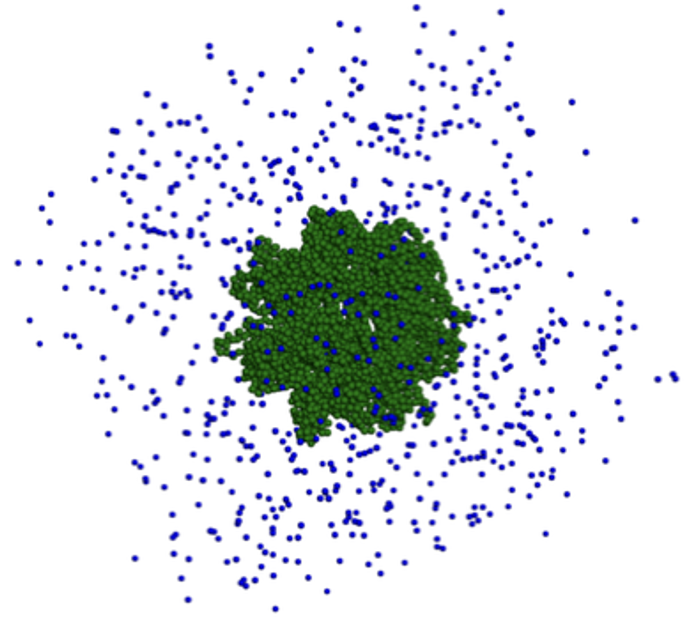

In [ ]:
#@title Install dependencies
%%capture
import os
import sys
import requests
from google.colab import files
!pip install py3dmol
!apt-get update && apt-get upgrade -y && apt-get install -y gzip pymol dssp
import py3Dmol
os.chdir('/content/')
!git clone https://github.com/timnugent/memembed
%cd memembed
!make
!git clone https://github.com/MishterBluesky/PoreFormer.git
%cd PoreFormer
!make
%cd ../
%cd ../
!pip install pdb2pqr vermouth gromacswrapper==0.8.3 MDAnalysis wget
!git clone https://github.com/pstansfeld/cg2at
!wget https://github.com/pstansfeld/MemProtMD/raw/main/gromacs.zip
!wget https://github.com/pstansfeld/MemProtMD/raw/main/gromacs_d.zip
!wget https://github.com/pstansfeld/MemProtMD/raw/main/martini_v300.zip
!wget https://github.com/MishterBluesky/PoreFormer.git
!unzip -o martini_v300.zip
!unzip -o gromacs_d.zip
!unzip -o PoreFormer-main.zip
%mv /content/usr/local/gromacs/ /usr/local/
!ln -s /usr/local/gromacs/bin/gmx /usr/bin/gmx
!ln -s /usr/local/gromacs/bin/gmx_d /usr/bin/gmx_d
import gromacs
import MDAnalysis
import glob
import shutil
import subprocess
import wget
import pandas as pd
from gromacs import grompp, editconf, make_ndx, trjconv, pdb2gmx, mdrun , mdrun_d

In [ ]:
!pip install py3dmol
!apt-get update && apt-get upgrade -y && apt-get install -y gzip pymol dssp

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading

In [ ]:
#@title Upload proteins
sys.path.append('/usr/local/lib/python3.7/site-packages/')
File_Location = "Upload"
os.chdir('/content/')

if File_Location == "Upload":
    upload = files.upload()
    filename = next(iter(upload))

def energy_minimize(filename, working_dir):
    if not os.path.exists("temp"):
        os.makedirs("temp")
    os.chdir("temp")
    os.system(f"pdb2pqr30 --ff CHARMM --keep-chain {working_dir + filename} pqr.pdb")

    pdb2gmx(f="pqr.pdb", ignh=True, ff="charmm27", water="tip3p", o="conf.pdb")
    editconf(f="conf.pdb", d=8, c=True, o="conf.pdb")

    with open("em.mdp", "w") as em:
        em.write("integrator = steep\nnsteps = 5000\nemtol = 100\nemstep = 0.001")

    grompp(f="em.mdp", maxwarn=5, o="em", c="conf.pdb")
    mdrun(deffnm="em", c="clean.pdb")

    trjconv(f="clean.pdb", o=working_dir + f"fixed-{filename}", s="em.tpr", input=("system"))

    os.chdir("..")
    shutil.rmtree("temp", ignore_errors=True)

def run_martinize2():
    cmd = [
        "martinize2",
        "-f", "protein.pdb",
        "-ff", "martini3001",
        "-x", "protein-cg.pdb",
        "-o", "protein-cg.top",
        "-elastic",
        "-ef", "500",
        "-eu", "1.0",
        "-el", "0.5",
        "-ea", "0",
        "-ep", "0",
        "-merge", "A",
        "-maxwarn", "100000",
        "-scfix"
    ]
    subprocess.run(cmd, check=True)


name = os.path.splitext(filename)[0]
working_dir = '/content/' + name + '/'
os.makedirs(working_dir, exist_ok=True)
os.rename(filename, working_dir + name + '.pdb')
os.chdir(working_dir)


def py3dmol_view(pdbfilename, working_dir):
    mview = py3Dmol.view(width=600, height=600)
    with open(working_dir + pdbfilename, "r") as f:
        mol1 = f.read()
    mview.addModel(mol1, "pdb")
    mview.setStyle({"cartoon": {"color": "spectrum"}})
    mview.setStyle({'resn': 'DUM'}, {'sphere': {}})
    mview.setStyle({'atom': 'BB'}, {'sphere': {}})
    mview.setStyle({'atom': 'PO4'}, {'sphere': {}})
    mview.setStyle({'atom': 'P'}, {'sphere': {}})
    mview.setBackgroundColor("0xffffff")
    mview.zoomTo()
    mview.show()

Saving ytev6spoiiie6.pdb to ytev6spoiiie6.pdb


In [ ]:
#@title Set-up Coarse-Grained Protein System
#@markdown This simplifies your protein(s) so it/they can be simulated in a large system such as the pore!
%%capture
working_dir = '/content/' + name + '/'
os.chdir(working_dir)
!mv {name}.pdb fullatom.pdb
for file in glob.glob(r'/content/martini_v300/martini*.itp'):
    print(file)
    shutil.copy(file, working_dir)

make_ndx(f='fullatom.pdb', o='index.ndx', input=('del 0', 'del 1-100','rDUM','q'),backup=False)
editconf(f='fullatom.pdb',o='protein.pdb',n='index.ndx',c=True,d=3,input=(0,0),backup=False)

u = MDAnalysis.Universe('protein.pdb')


box = (u.dimensions/10.0)

with open('protein.pdb', 'r') as file :
    filedata = file.read()
filedata = filedata.replace('HSE', 'HIS').replace('HSD', 'HIS').replace('MSE', 'MET').replace(' SE ', ' SD ')
with open('protein.pdb', 'w') as file:
    file.write(filedata)

run_martinize2()

py3dmol_view('protein-cg.pdb', working_dir)

In [ ]:
import numpy as np
from google.colab import widgets
!gmx editconf -f "/content/{name}/protein-cg.pdb" -o "/content/{name}/protein-cg.gro"
def read_gro(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()

    coord_lines = lines[2:-1]  # Skip header and box size line
    coordinates = []

    for line in coord_lines:
        x, y, z = map(float, line[20:44].split())  # Extract x, y, z coordinates
        coordinates.append([x, y, z])

    return np.array(coordinates)

def calculate_box_size(coordinates, padding):
    min_coords = np.min(coordinates, axis=0)
    max_coords = np.max(coordinates, axis=0)
    box_size = max_coords - min_coords + padding
    return box_size

def main(padding):
    file_path = "protein-cg.gro"

    coordinates = read_gro(file_path)
    box_size = calculate_box_size(coordinates, padding)

    box_x, box_y, box_z = box_size[0], box_size[1], box_size[2]

    print(f"Suggested box size (nm): {box_x:.3f} {box_y:.3f} {box_z:.3f}")

    return box_x, box_y, box_z
#@markdown Please choose your padding size of solution around the protein in nanometers.
padding =  10 #@param
box_x, box_y, box_z = main(padding)
main(padding)

                     :-) GROMACS - gmx editconf, 2023.4 (-:

Executable:   /usr/local/gromacs/bin/gmx
Data prefix:  /usr/local/gromacs
Working dir:  /content/ytev6spoiiie6
Command line:
  gmx editconf -f /content/ytev6spoiiie6/protein-cg.pdb -o /content/ytev6spoiiie6/protein-cg.gro

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 7098 atoms
No velocities found

See the GROMACS manual for a description of the requirements that
must be satisfied by descriptions of simulation cells.

GROMACS reminds you: "Computer system analysis is like child-rearing; you can do grievous damage, but you cannot ensure success." (Tom DeMarcho)

Suggested box size (nm): 22.291 22.131 21.230
Suggested box size (nm): 22.291 22.131 21.230


(22.291, 22.131, 21.23)

In [ ]:
def get_max_box_size(box_x, box_y, box_z):
    max_box_size = max(box_x, box_y, box_z)
    print(f"Max box size for cube (nm): {max_box_size:.3f}")
    return max_box_size
max_box_size = get_max_box_size(box_x, box_y, box_z)

Max box size for cube (nm): 22.291


In [ ]:
#@title Insert protein into solution
#@markdown Solution former wraps your coarse grain protein in a solution of NA ions of your choosing at neutral pH.
%%capture
%cd /content/memembed/PoreFormer
!chmod +x solutionbuilder.sh

poredir = "/content/memembed/PoreFormer"
workdir = '/content/' + name + '/'

!mv "/content/{name}/protein-cg.gro" "/content/memembed/PoreFormer/6_{name}.gro"
protein_pdb = f"{name}.gro"
protein_no = 1
name = f"{name}"

command = f"./solutionbuilder.sh '{name}' '{protein_pdb}' '{protein_no}' '{workdir}' '{poredir}' '{max_box_size}'"
!{command}

In [ ]:
#@title Visualise Pore with protein inserted. (Pre-equillibration)
working_dir = "/content/memembed/PoreFormer/"
def py3dmol_view(pdbfilename, working_dir):
    mview = py3Dmol.view(width=1200, height=1200)
    with open(working_dir + pdbfilename, "r") as f:
        mol1 = f.read()
    mview.addModel(mol1, "pdb")
    mview.setStyle({"cartoon": {"color": "spectrum"}})
    mview.setStyle({'atom': 'CB'}, {'sphere': {"color": "green"}})
    mview.setStyle({'atom': 'CA'}, {'sphere': {"color": "green"}})
    mview.setStyle({'atom': 'CG'}, {'sphere': {"color": "green"}})
    mview.setStyle({'atom': 'BB'}, {'sphere': {"color": "green"}})
    mview.setStyle({'atom': 'PO4'}, {'sphere': {}})
    mview.setStyle({'atom': 'P'}, {'sphere': {}})
    mview.setBackgroundColor("0xffffff")
    mview.zoomTo()
    mview.show()
APLFILE = f"7_{name}.gro"
!echo $APL
!gmx editconf -f $APLFILE -o "output.pdb"
py3dmol_view("output.pdb",working_dir)


                     :-) GROMACS - gmx editconf, 2023.4 (-:

Executable:   /usr/local/gromacs/bin/gmx
Data prefix:  /usr/local/gromacs
Working dir:  /content/memembed/PoreFormer
Command line:
  gmx editconf -f 7_ytev6spoiiie6.gro -o output.pdb

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 7098 atoms
Volume: 11074.7 nm^3, corresponds to roughly 4983500 electrons
No velocities found

GROMACS reminds you: "Computer system analysis is like child-rearing; you can do grievous damage, but you cannot ensure success." (Tom DeMarcho)



3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
#@markdown We will analyse your gro file and return a topol.top. You can use this and the associated .itp files as well as .gro file to run a simulation. The Solution builder script will do this for you.
!mv martinish3 martinish3.sh
!chmod +x martinish3.sh
protein_pdb = f"7_{name}"
translate = 1
workdir = '/content/' + name + '/'
martinish = f"./martinish3.sh {name} {protein_pdb} {workdir} {poredir} {translate}"
!{martinish}
!chmod +x topolsolution.sh
topol = f"./topolsolution.sh  '{APLFILE}' '{name}' '{protein_no}'"
# Execute the topol
!{topol}

mv: cannot stat 'martinish3': No such file or directory
Martinish is making a backup of 7_ytev6spoiiie6 called Untouched_7_ytev6spoiiie6
mv: cannot stat '*.itp': No such file or directory
sed: can't read ytev6spoiiie6.gro: No such file or directory
Topology file 'topol.top' created successfully.


In [ ]:
#@title Checkpoint
import os
from google.colab import files

# List of files to zip
files_to_zip = ['martini_v3.0.0.itp', 'martini_v3.0_CDLs.itp', 'martini_v3.0.0_ions_v1.itp', 'martini_v3.0.0_solvents_v1.itp', 'martini_v3.0.0_phospholipids_v1.itp','topol.top',f'{APLFILE}']

# Additional .itp files that don't include the word "martini"
additional_itp_files = [filename for filename in os.listdir('.') if filename.endswith('.itp') and 'martini' not in filename]

# Destination zip file name
zip_file_name = f'Solutionformer_{name}.zip'

# Combine the lists of files to zip
files_to_zip += additional_itp_files

# Zip the files
os.system('zip -r {} {}'.format(zip_file_name, ' '.join(map(str, files_to_zip))))

# Download the zip file
files.download(zip_file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title Add Ions and prepare - Molar concentration.
!chmod +x AfterSolution.sh
conc = 0.1 #@param
#@markdown Please denote the NaCl concentration in moles. Note that the pH is neutralised to 7.
Simulate = f"./AfterSolution.sh 1 '{name}' '{conc}'"
# Execute Sim
!{Simulate}

                      :-) GROMACS - gmx grompp, 2023.4 (-:

Executable:   /usr/local/gromacs/bin/gmx
Data prefix:  /usr/local/gromacs
Working dir:  /content/memembed/PoreFormer
Command line:
  gmx grompp -f em2.mdp -o emx_ytev6spoiiie6 -c 7_ytev6spoiiie6.gro -p topol.top -maxwarn 1000

Ignoring obsolete mdp entry 'ns_type'

NOTE 1 [file em2.mdp]:
  You have set rlist larger than the interaction cut-off, but you also have
  verlet-buffer-tolerance > 0. Will set rlist using
  verlet-buffer-tolerance.

Setting the LD random seed to -10798089

Generated 844 of the 356590 non-bonded parameter combinations

Excluding 1 bonded neighbours molecule type 'molecule_0'

Excluding 1 bonded neighbours molecule type 'molecule_1'

Excluding 1 bonded neighbours molecule type 'molecule_2'

Excluding 1 bonded neighbours molecule type 'molecule_3'

Excluding 1 bonded neighbours molecule type 'molecule_4'

Excluding 1 bonded neighbours molecule type 'molecule_5'

Excluding 1 bonded neighbours molecule type

In [ ]:
#@title Download files for simulation
import os
from google.colab import files
APLFILE2 = f"11b_{name}.gro"
TPR = f"12_md20_{name}.tpr"
# List of files to zip
files_to_zip = ['martini_v3.0.0.itp', 'martini_v3.0_CDLs.itp', 'martini_v3.0.0_ions_v1.itp', 'martini_v3.0.0_solvents_v1.itp', 'martini_v3.0.0_phospholipids_v1.itp','topol.top',f'{APLFILE}',f'{APLFILE2}',f'{TPR}']

# Additional .itp files that don't include the word "martini"
additional_itp_files = [filename for filename in os.listdir('.') if filename.endswith('.itp') and 'martini' not in filename]

# Destination zip file name
zip_file_name = f'Solutionformer_{name}.zip'

# Combine the lists of files to zip
files_to_zip += additional_itp_files

# Zip the files
os.system('zip -r {} {}'.format(zip_file_name, ' '.join(map(str, files_to_zip))))

# Download the zip file
files.download(zip_file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title View your Protein system with Buffer
APLFILE2 = f"11b_{name}.gro"
!gmx editconf -f $APLFILE2 -o "equilibrated.pdb"
def py3dmol_view(pdbfilename, working_dir):
    mview = py3Dmol.view(width=1200, height=1200)
    with open(working_dir + pdbfilename, "r") as f:
        mol1 = f.read()
    mview.addModel(mol1, "pdb")
    mview.setStyle({'atom': 'CB'}, {'sphere': {"color": "green"}})
    mview.setStyle({'atom': 'CA'}, {'sphere': {"color": "green"}})
    mview.setStyle({'atom': 'CG'}, {'sphere': {"color": "green"}})
    mview.setStyle({'atom': 'BB'}, {'sphere': {"color": "green"}})
    mview.setStyle({'atom': 'NA'}, {'sphere': {"color": "blue"}})
    mview.setStyle({'atom': 'PO4'}, {'sphere': {}})
    mview.setStyle({'atom': 'P'}, {'sphere': {}})
    mview.setBackgroundColor("0xffffff")
    mview.zoomTo()
    mview.show()
py3dmol_view(f"equilibrated.pdb",working_dir)

                     :-) GROMACS - gmx editconf, 2023.4 (-:

Executable:   /usr/local/gromacs/bin/gmx
Data prefix:  /usr/local/gromacs
Working dir:  /content/memembed/PoreFormer
Command line:
  gmx editconf -f 11b_ytev6spoiiie6.gro -o equilibrated.pdb

Note that major changes are planned in future for editconf, to improve usability and utility.
Read 93862 atoms
Volume: 11042.2 nm^3, corresponds to roughly 4968900 electrons
Velocities found

Back Off! I just backed up equilibrated.pdb to ./#equilibrated.pdb.1#

GROMACS reminds you: "I am driven by two main philosophies: know more today about the world than I knew yesterday and lessen the suffering of others. You'd be surprised how far that gets you." (Neil deGrasse Tyson)



3Dmol.js failed to load for some reason. Please check your browser console for error messages.